<a href="https://colab.research.google.com/github/VisuArtFusion/ai-docommiter/blob/main/MotionDiffuse2OpenPose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Adaption of Motion Diffusion to allow txt2motion to generate OpenPose skeleton image sequences for use with ControlNet in Stable Diffusion

This was adapted from (https://mingyuan-zhang.github.io/projects/MotionDiffuse.html).

It uses Google Drive to hold the snapshot zip from the original colab. It also uses google drive directory to share images with the stable diffusion web-ui colab.(https://github.com/nolanaatama/sd-1click-colab/blob/main/controlnet.ipynb)

*   expected path MDM snapshot /content/drive/MyDrive/colab/MDM/MotionDiffuse.zip
*   expected path to working image files is /content/drive/MyDrive/colab/img2img




## Preparation

Install necessities and download data for **MotionDiffuse**

NOTE: You must save a copy of https://drive.google.com/uc?id=1vzBZ2rNCQWBQpYvC6hpyJfR3iK1O_FEG to your own Google Drive at /content/drive/MyDrive/colab/MDM/MotionDiffuse.zip

In [ ]:
!nvidia-smi

Sun Feb 19 00:33:48 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0    26W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!apt install ffmpeg
!pip install git+https://github.com/openai/CLIP.git
!pip install mmcv
!pip install mediapy

Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:4.2.7-0ubuntu0.1).
The following package was automatically installed and is no longer required:
  libnvidia-common-510
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 21 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-2na7dnkq
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-2na7dnkq
  Resolved https://github.com/openai/CLIP.git to commit 3702849800aa56e2223035bccd1c6ef91c704ca8
  Preparing metadata (setup.py) ... done
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#get zip from google drive
from google.colab import drive
drive.mount('/content/drive')
!cp /content/drive/MyDrive/colab/MDM/MotionDiffuse.zip .
!unzip MotionDiffuse.zip
import os
os.chdir("MotionDiffuse")

Mounted at /content/drive
Archive:  MotionDiffuse.zip
   creating: MotionDiffuse/
   creating: MotionDiffuse/checkpoints/
   creating: MotionDiffuse/checkpoints/t2m/
   creating: MotionDiffuse/checkpoints/t2m/t2m_motiondiffuse/
   creating: MotionDiffuse/checkpoints/t2m/t2m_motiondiffuse/meta/
  inflating: MotionDiffuse/checkpoints/t2m/t2m_motiondiffuse/meta/mean.npy  
  inflating: MotionDiffuse/checkpoints/t2m/t2m_motiondiffuse/meta/std.npy  
   creating: MotionDiffuse/checkpoints/t2m/t2m_motiondiffuse/model/
  inflating: MotionDiffuse/checkpoints/t2m/t2m_motiondiffuse/model/latest.tar  
  inflating: MotionDiffuse/checkpoints/t2m/t2m_motiondiffuse/opt.txt  
   creating: MotionDiffuse/datasets/
  inflating: MotionDiffuse/datasets/dataloader.py  
  inflating: MotionDiffuse/datasets/dataset.py  
  inflating: MotionDiffuse/datasets/evaluator.py  
  inflating: MotionDiffuse/datasets/evaluator_models.py  
  inflating: MotionDiffuse/datasets/__init__.py  
   creating: MotionDiffuse/models/
 

## Generate Motion and Images

In [ ]:
#@title text2motion
sequence_name = "backflip" #@param {type:"string"}
prompt = "a person " #@param {type:"string"}
frames = 240 #@param {type:"integer"}
output_directory = "/content/drive/MyDrive/colab/img2img" #@param {type:"string"}

out_path = os.path.join(output_directory, sequence_name)

if not os.path.exists(out_path):
  os.mkdir(out_path)

# %env PYTHONPATH=.:$PYTHONPATH
# !python -u tools/visualization.py \
#     --opt_path checkpoints/t2m/t2m_motiondiffuse/opt.txt \
#     --text "{prompt}" \
#     --motion_length {frames} \
#     --result_path "{out_path}/preview.mp4"
import torch
from os.path import join as pjoin
import utils.paramUtil as paramUtil
from torch.utils.data import DataLoader
from utils.plot_script import *
from utils.get_opt import get_opt
from datasets.evaluator_models import MotionLenEstimatorBiGRU

from trainers import DDPMTrainer
from models import MotionTransformer
from utils.word_vectorizer import WordVectorizer, POS_enumerator
from utils.utils import *
from utils.motion_process import recover_from_ric
import numpy as np


def build_models(opt):
    encoder = MotionTransformer(
        input_feats=opt.dim_pose,
        num_frames=opt.max_motion_length,
        num_layers=opt.num_layers,
        latent_dim=opt.latent_dim,
        no_clip=opt.no_clip,
        no_eff=opt.no_eff)
    return encoder


# parser = argparse.ArgumentParser()
# parser.add_argument('--opt_path', type=str, help='Opt path')
# parser.add_argument('--text', type=str, default="", help='Text description for motion generation')
# parser.add_argument('--motion_length', type=int, default=60, help='Number of frames for motion generation')
# parser.add_argument('--result_path', type=str, default="test_sample.gif", help='Path to save generation result')
# args = parser.parse_args()

gpu_id = -1
opt_path = "checkpoints/t2m/t2m_motiondiffuse/opt.txt"
device = torch.device('cuda:%d' % gpu_id if gpu_id != -1 else 'cpu')
opt = get_opt(opt_path, device)
opt.do_denoise = True

assert opt.dataset_name == "t2m"
#assert frames <= 196
opt.data_root = './dataset/HumanML3D'
opt.motion_dir = pjoin(opt.data_root, 'new_joint_vecs')
opt.text_dir = pjoin(opt.data_root, 'texts')
opt.joints_num = 22
opt.dim_pose = 263
dim_word = 300
dim_pos_ohot = len(POS_enumerator)
num_classes = 200 // opt.unit_length

mean = np.load(pjoin(opt.meta_dir, 'mean.npy'))
std = np.load(pjoin(opt.meta_dir, 'std.npy'))

encoder = build_models(opt).to(device)
trainer = DDPMTrainer(opt, encoder)
trainer.load(pjoin(opt.model_dir, opt.which_epoch + '.tar'))

trainer.eval_mode()
trainer.to(opt.device)

result_dict = {}
with torch.no_grad():
    if frames != -1:
        caption = [prompt]
        m_lens = torch.LongTensor([frames]).to(device)
        pred_motions = trainer.generate(caption, m_lens, opt.dim_pose)
        motion = pred_motions[0].cpu().numpy()
        motion = motion * std + mean
        with open(os.path.join(out_path, "motion.npy"), "wb") as f:
          np.save(f, motion)
with open(os.path.join(out_path, "prompt.txt"), "w") as f:
  f.write(prompt)
# # Display the output video in Colab
# from IPython.display import HTML
# from base64 import b64encode
# mp4 = open(f'{out_path}/preview.mp4','rb').read()
# data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
# HTML("""<video width=400 controls><source src="%s" type="video/mp4"></video>""" % data_url)

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


Reading checkpoints/t2m/t2m_motiondiffuse/opt.txt


100%|███████████████████████████████████████| 338M/338M [00:04<00:00, 83.6MiB/s]


  0%|          | 0/1000 [00:00<?, ?it/s]

""

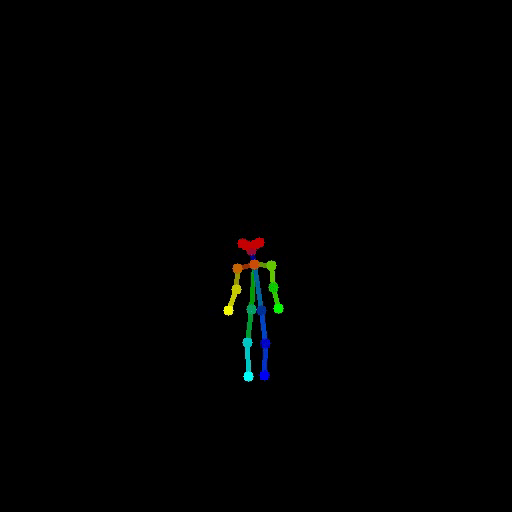

In [ ]:
#@title Create OpenPose style image sequence from motion data
from scipy.spatial.transform import Rotation
camera_pose = "(0.0,0,0,0,-1.5,-3.5)" #@param {type:"string"}
fov = 300 #@param {type:"number"}
import numpy as np
import torch
import cv2
from utils.motion_process import recover_from_ric
import tqdm
import ast


OpenPoseIDs_to_SMPL = {
    "head": [15,(155,11,53)],
    "neck": [[13,(207,76,6)],[14,(207,76,6)]],
    "lshoulder": [16,(200,100,4)],
    "rshoulder": [17,(100,200,2)],
    "lelbow": [18,(200,200,0)],
    "relbow": [19,(6,200,1)],
    "lwrist": [20,(250,250,0)],
    "rwrist": [21,(0,250,0)],
    "lhip": [1,(5,160,103)],
    "rhip": [2,(0,50,150)],
    "lknee": [4,(0,200,200)],
    "rknee": [5,(4,4,200)],
    "lankle": [7,(0,255,255)],
    "rankle": [8,(0,1,250)],
    "leye": [0,(200,1,0)],
    "reye": [0,(200,1,0)],
    "lear": [0,(200,1,0)],
    "rear": [0,(200,1,0)],
    }

OpenPoseLimbs = [
    ["head","neck", (0,0,155)],
    ["neck","lshoulder", (150,50,3)],
    ["neck","rshoulder", (100,150,2)],
    ["lshoulder","lelbow", (150,150,0)],
    ["rshoulder","relbow", (100,200,1)],
    ["lelbow","lwrist", (200,200,0)],
    ["relbow","rwrist", (50,200,0)],
    ["neck","lhip", (1,158,3)],
    ["neck","rhip", (1,100,155)],
    ["lhip","lknee", (0,154,54)],
    ["rhip","rknee", (1,70,200)],
    ["lknee","lankle", (0,200,200)],
    ["rknee","rankle", (0,50,200)],
    ["head","leye", (200,0,200)],
    ["head","reye", (200,0,0)],
    ["lear","leye", (200,0,200)],
    ["rear","reye", (200,0,0)],
]

#from openpose, but rendered with an alpha value?
limb_colors = [[255, 0, 0], 
               [255, 85, 0], 
               [255, 170, 0], 
               [255, 255, 0], 
               [170, 255, 0], 
               [85, 255, 0], 
               [0, 255, 0],
              [0, 255, 85], 
               [0, 255, 170], 
               [0, 255, 255], 
               [0, 170, 255], 
               [0, 85, 255], 
               [0, 0, 255], 
               [85, 0, 255],
                [170, 0, 255], 
               [255, 0, 255], 
               [255, 0, 170], 
               [255, 0, 85], 
               [0, 0, 0]]


fx,fy = (fov,fov)
size = (512,512,3)
K = np.array([[fx, 0, size[0]/2],
              [0, fy, size[1]/2],
              [0, 0, 1]], dtype=np.float32)
D = np.zeros((5,1), dtype=np.float32)

pose_tuple = ast.literal_eval(camera_pose)

rvec = np.array(pose_tuple[0:3], dtype=np.float32)
tvec = np.array(pose_tuple[3:6], dtype=np.float32)

IMG_DIR = os.path.join(out_path, "images")
if not os.path.exists(IMG_DIR):
  os.mkdir(IMG_DIR)
else:
  !rm {os.path.join(IMG_DIR)}/*.jpg

with open(os.path.join(out_path,'motion.npy'), 'rb') as f:
  data = np.load(f)
  joints_num = 22
  joint = recover_from_ric(torch.from_numpy(data).float(), joints_num).numpy()

  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  video = cv2.VideoWriter(f"{out_path}/skeleton.mp4", fourcc, 30,size[:2])
  for i,frame in enumerate(joint):
    img = np.zeros(size, dtype=np.uint8)
    scaler = 150  
    offset = size[0]/2

    #original SMPL points
    # for k,j in enumerate(frame):
    #   cv2.circle(img, (int(j[0]*scaler+offset),int(-j[1]*scaler+offset)), 3, SMPL_joint_colors[k],-1)

    op_joints = {}
    op_joints3D = {}
    joint_size = 5
    limb_size = 3

    #compute joints from SMPL skeleton
    for k in OpenPoseIDs_to_SMPL:
      if k == "neck":
        a,b = OpenPoseIDs_to_SMPL[k]
        idx1,color = a
        idx2,c2 = b
        op_joints3D[k] = (np.array([frame[idx1]]) + np.array(frame[idx2]))/2
      else:
        idx, color = OpenPoseIDs_to_SMPL[k]
        op_joints3D[k] = np.array([frame[idx]])

    # construct eye and ear joints using shoulders and neck to head
    shoulder_vec = op_joints3D["lshoulder"] - op_joints3D["rshoulder"]
    shoulder_mag = np.linalg.norm(shoulder_vec)
    shoulder_vec /= shoulder_mag
    eye_mag = shoulder_mag/8
    head_neck_vec = op_joints3D["head"] - op_joints3D["neck"]
    head_neck_vec /= np.linalg.norm(head_neck_vec)
    forward_vec = np.cross(shoulder_vec, head_neck_vec)
    forward_vec /= np.linalg.norm(forward_vec)
    #eyes are slightly up and to the side
    op_joints3D["leye"] = op_joints3D["head"] + shoulder_vec*eye_mag + head_neck_vec*eye_mag
    op_joints3D["reye"] = op_joints3D["head"] - shoulder_vec*eye_mag + head_neck_vec*eye_mag
    #ears are toward the back of the head
    op_joints3D["lear"] = op_joints3D["head"] + shoulder_vec*eye_mag*2 - forward_vec*eye_mag*2 + head_neck_vec*eye_mag
    op_joints3D["rear"] = op_joints3D["head"] - shoulder_vec*eye_mag*2 - forward_vec*eye_mag*2 + head_neck_vec*eye_mag
    
    #push the head point forward to become the nose
    op_joints3D["head"] += forward_vec*eye_mag

    # transforms 3D points and check if back is facing camers
    r = Rotation.from_euler("xyz",rvec)
    zeros = np.zeros((1,3))
    for k in op_joints3D:
        op_joints3D[k] = r.apply(op_joints3D[k]) + tvec
        p = cv2.projectPoints(op_joints3D[k],zeros, zeros, K, D)[0][0][0]
        op_joints[k] = (int(p[0]),int(p[1]))
    camera_dir = -op_joints3D['neck']
    camera_dir /= np.linalg.norm(camera_dir)


    #check if back is toward camera
    shoulder_vec = op_joints3D["lshoulder"] - op_joints3D["rshoulder"]
    shoulder_mag = np.linalg.norm(shoulder_vec)
    shoulder_vec /= shoulder_mag
    eye_mag = shoulder_mag/8
    head_neck_vec = op_joints3D["head"] - op_joints3D["neck"]
    head_neck_vec /= np.linalg.norm(head_neck_vec)
    forward_vec = np.cross(shoulder_vec, head_neck_vec)
    forward_vec /= np.linalg.norm(forward_vec)

    camera_dot = np.dot(camera_dir, forward_vec.transpose())
    back_to_camera = camera_dot < -0.1

    #draw limbs
    for l in OpenPoseLimbs:
      color = tuple(reversed(l[2]))
      if back_to_camera:
        if l[0] in ["leye", "lear", "reye", "rear"]:
          continue
        if l[1] in ["leye", "lear", "reye", "rear"]:
          continue
      cv2.line(img, op_joints[l[0]],op_joints[l[1]], color,limb_size)

    #draw joints
    for k in OpenPoseIDs_to_SMPL:
      if k == "neck":
        a,b = OpenPoseIDs_to_SMPL[k]
        idx1,color = a
      else:
        idx, color = OpenPoseIDs_to_SMPL[k]
      if back_to_camera:
        if k in ["leye", "lear", "reye", "rear"]:
          continue
      color = tuple(reversed(color))
      cv2.circle(img, op_joints[k], joint_size, color,-1)
    
    #save video files  
    cv2.imwrite(f"{IMG_DIR}/{i:03}.jpg", img)
    video.write(img)
video.release()

import mediapy as media
video2 = media.read_video(f"{out_path}/skeleton.mp4")
media.show_video(video2, fps=30, codec='gif')

In [ ]:
!ls -al checkpoints/t2m/t2m_motiondiffuse/model

total 931652
drwxr-xr-x 2 root root      4096 Oct  4 00:48 .
drwxr-xr-x 4 root root      4096 Oct  6 03:10 ..
-rw-r--r-- 1 root root 953997124 Oct  4 00:47 latest.tar


In [ ]:
print(f"Goto stable diffustion Automatic1111 WebUI and point img2img batch processor to read images from: {IMG_DIR}")
print(f"Save stable diffustion results to this output directory: {os.path.join(out_path,'output')}")

Goto stable diffustion Automatic1111 WebUI and point img2img batch processor to read images from: /content/drive/MyDrive/colab/img2img/drunk/images
Save stable diffustion results to this output directory: /content/drive/MyDrive/colab/img2img/drunk/output


## After diffusion batch processing is complete, Generate video/gif of results

100%|██████████| 196/196 [00:02<00:00, 95.86it/s]


""

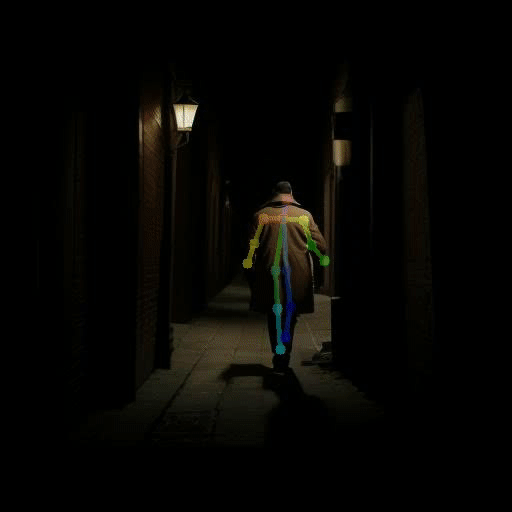

In [ ]:
from tqdm import tqdm

#@title Generate Video/Gif of output from stable diffusion results.  if processing result from above, use the sequence name above
folder_name = "drunk3" #@param {type:"string"}
skeleton_opacity = 20 #@param {type:"slider", min:0, max:100, step:10}
mode = "overlay_skeleton" #@param ["output_only", "overlay_skeleton", "sidebyside_skeleton"]

out_path = os.path.join(os.path.dirname(out_path),folder_name)
#convert output images to video
# Set the directory containing the input images and the output video file path
input_dir = os.path.join(out_path,"output")
input_dir2 = os.path.join(out_path,"images")
output_file = os.path.join(out_path,"output.mp4")

# Get the list of input image file names
image_files = sorted(os.listdir(input_dir))
# Get the first image to determine the output video size
img = cv2.imread(os.path.join(input_dir, image_files[0]))
height, width, channels = img.shape

# Create a video writer object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
if mode != "sidebyside_skeleton":
  video_writer = cv2.VideoWriter(output_file, fourcc, 25, (width, height))
else:
  video_writer = cv2.VideoWriter(output_file, fourcc, 25, (width*2, height))

# Write each image to the video
for image_file in tqdm(image_files):
    image_path = os.path.join(input_dir, image_file)
    img = cv2.imread(image_path)
    image_path2 = os.path.join(input_dir2, image_file)
    img2 = cv2.imread(image_path2)
    #output images
    if mode == "output_only":
      video_writer.write(img)

    #overlay images
    if mode == "overlay_skeleton":
      cv2.addWeighted(img, 1, img2, skeleton_opacity/100, 0, img)
      video_writer.write(img)

    #side by side
    if mode == "sidebyside_skeleton":
      outimg = np.zeros((height, 2*width, 3), dtype=np.uint8)
      outimg[:,0:width] = img
      outimg[:,width:] = img2
      video_writer.write(outimg)

# Release the video writer object and close any open windows
video_writer.release()
cv2.destroyAllWindows()

import mediapy as media
video2 = media.read_video(output_file)
media.show_video(video2, fps=30, codec='gif')
media.write_video(os.path.join(out_path,"output.gif"),video2, fps=30, codec='gif')